In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy

from matplotlib import animation, rc
from IPython.display import HTML
rc('animation', html='jshtml')
import seaborn as sns

#Define plotting style:
sns.set() #Set style
sns.set_style('ticks',{'font.family':'serif', 'font.serif':'Times New Roman'})
sns.set_style('ticks',{'font.family':'serif', 'font.serif':'Times New Roman'})
sns.set_context('paper', font_scale=1.8,  rc={"lines.linewidth": 3})
sns.set_palette(sns.color_palette("deep"))

#### Auxiliar function for building animation for function

In [3]:
def animate2D(i,func,t0,dt,rline,left_point,right_point,v_left,v_right,title,w):
    #Get list of t points up to ith time:
    tf = t0+dt*(i+1)
    xpts = rline.get_data()[0]
    ypts = func(t=tf,x=xpts,w=w)

    if title:
        title.set_text(r't = %1.1f s' %(tf))
    
    rline.set_data(xpts,ypts)
    left_point.set_data([min(xpts)],[func(t=tf,x=min(xpts),w=w)])
    right_point.set_data([max(xpts)],[func(t=tf,x=max(xpts),w=w)])

    
    return (rline,)


def setupFig(func,t0,xpts,**kwargs):
    ypts = func(t=t0,x=xpts,**kwargs)
    xmin,xmax = min(xpts),max(xpts)
    ymin,ymax = min(ypts),max(ypts)
    ymin = 2.2
    ymax = -2.2    
        
    fig = plt.figure(figsize=(6,4))
    ax1 = plt.subplot(111)
    ax1.set_xlim(xmin,xmax)
    ax1.set_ylim(ymin,ymax)
    ax1.set_yticks([])
    ax1.set_xticks([])
    title = ax1.set_title("t = %1.1f" %t0)
    
    #Plot function
    rline, = ax1.plot(xpts,ypts,'-',alpha=0.9)
    
    #Plot points:
    left_point, = ax1.plot([xmin],[func(t=t0,x=xmin,**kwargs)],'o',markersize=14,
                           zorder=10,color='brown') 
    right_point, = ax1.plot([xmax],[func(t=t0,x=xmax,**kwargs)],'o',markersize=14,
                           zorder=10,color='brown') 
    #Plot vertical lines
    v_left = ax1.hlines(y=func(t=t0,x=xmin,**kwargs),xmin=xmin,xmax=xmax,linestyle='--',color='gray',alpha=0)
    v_right = ax1.hlines(y=func(t=t0,x=xmax,**kwargs),xmin=xmin,xmax=xmax,linestyle='--',color='gray',alpha=0)
    hline = ax1.hlines(y=0.0,xmin=xmin,xmax=xmax,linestyle='-',color='red',alpha=0.5)
    
    plt.tight_layout()
    
    return fig,rline,left_point,right_point,v_left,v_right,title

### Onda plana

In [4]:
@np.vectorize
def E(t,x,w):
    return np.sin(w*(t-x))

@np.vectorize
def E_stand(t,x,w):
    return np.sin(w*(t-x))+np.sin(w*(-t-x))

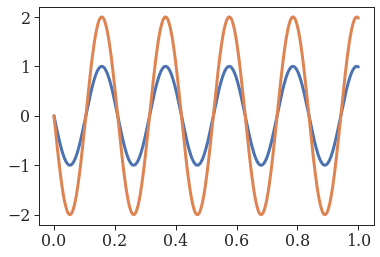

In [5]:
#Constantes em unidades arbitrárias:
w = 30 #frequencia angular
#Condicoes iniciais:
t0 = 0
xpts = np.linspace(0,1,500)
E_sol = E(t=t0,x=xpts,w=w)
E_sol2 = E_stand(t=t0,x=xpts,w=w)


fig = plt.figure(figsize=(6,4))
plt.plot(xpts,E_sol)
plt.plot(xpts,E_sol2)
plt.show()

In [18]:
#Set up plot
t0,tmax = 0.0,2
n = 8
w = n*np.pi/max(xpts)
fig,rline,left_point,right_point,v_left,v_right,title = setupFig(E_stand,t0,xpts,w=w)
plt.savefig('standingWave1.pdf')
#Define time step:
dt = (tmax-t0)/600.
#Define real time step:
interval = 20

anim = animation.FuncAnimation(fig, animate2D,
                               frames=int((tmax-t0)/dt), interval=interval, 
                               blit=True, fargs=(E_stand,t0,dt,rline,left_point,right_point,v_left,v_right,title,w))
plt.close()
anim


In [19]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='AL'), bitrate=1800)
anim.save('standingWave1.mp4', writer=writer)

In [8]:
#Set up plot
t0,tmax = 0.0,2
n = 2
w = n*np.pi/max(xpts)
fig,rline,left_point,right_point,v_left,v_right,title = setupFig(E_stand,t0,xpts,w=w)
plt.savefig('standingWave2.pdf')
#Define time step:
dt = (tmax-t0)/300.
#Define real time step:
interval = 20

anim = animation.FuncAnimation(fig, animate2D,
                               frames=int((tmax-t0)/dt), interval=interval, 
                               blit=True, fargs=(E_stand,t0,dt,rline,left_point,right_point,v_left,v_right,title,w))
plt.close()
anim


In [9]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='AL'), bitrate=1800)
anim.save('standingWave2.mp4', writer=writer)

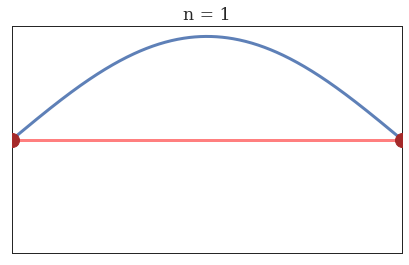

In [10]:
#Set up plot
t0,tmax = 0.0,2
n = 1
w = n*np.pi/max(xpts)
fig,rline,left_point,right_point,v_left,v_right,title = setupFig(E_stand,t0,xpts,w=w)
plt.title('n = %i' %n)
plt.savefig('standingWave3a.pdf')

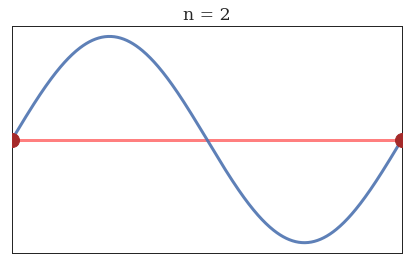

In [11]:
#Set up plot
t0,tmax = 0.0,2
n = 2
w = n*np.pi/max(xpts)
fig,rline,left_point,right_point,v_left,v_right,title = setupFig(E_stand,t0,xpts,w=w)
plt.title('n = %i' %n)
plt.savefig('standingWave3b.pdf')

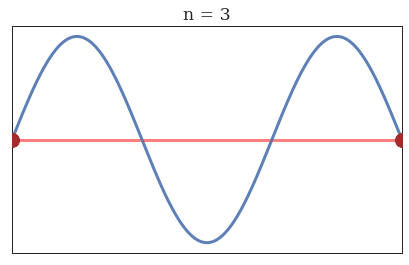

In [12]:
#Set up plot
t0,tmax = 0.0,2
n = 3
w = n*np.pi/max(xpts)
fig,rline,left_point,right_point,v_left,v_right,title = setupFig(E_stand,t0,xpts,w=w)
plt.title('n = %i' %n)
plt.savefig('standingWave3c.pdf')

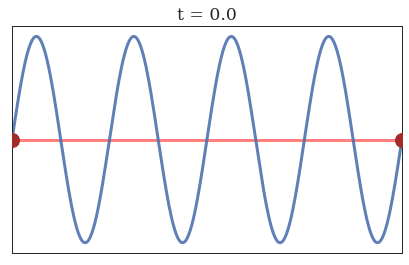

In [21]:
#Set up plot
t0,tmax = 0.0,2
n = 8
w = n*np.pi/max(xpts)
fig,rline,left_point,right_point,v_left,v_right,title = setupFig(E_stand,t0,xpts,w=w)
# plt.title('n = %i' %n)
plt.savefig('standingWave3d.pdf')